In [1]:
import torch.optim as optim
import torch.nn as nn
from tqdm.notebook import tqdm
from torchvision.transforms import v2
from torchvision.io import read_image
import torch
import matplotlib.pyplot as plt
from helpers import plot
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from torchinfo import summary
import numpy as np
from deep_image_prior.models import get_net
from deep_image_prior.utils.common_utils import plot_image_grid, torch_to_np

In [2]:
img_size = (512, 512)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

transforms = v2.Compose(
    [
        v2.Resize(img_size),
        v2.ToDtype(torch.float32, scale=True),
        # v2.Normalize(mean=[0.5], std=[0.5]),
    ]
)
img = read_image("data/F16_GT.png")
img = transforms(img)

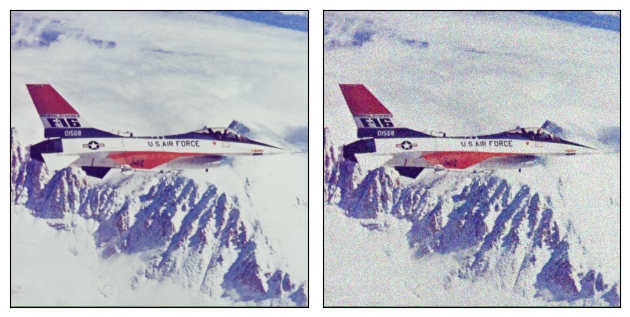

In [3]:
def get_noisy_image(img, sigma):
    return torch.clip(img + torch.normal(0.0, sigma, size=img.shape), 0, 1).detach()


sigma = 25
sigma_ = sigma / 255.0
noisy_img = get_noisy_image(img, sigma_)

plot([img, noisy_img])

In [4]:
# def generate_noise(noise_type, shape: tuple[int]):
#     if noise_type == "normal":
#         return torch.randn(shape)
#     elif noise_type == "uniform":
#         return (
#             torch.FloatTensor(*shape).uniform_(0, 1) * 1.0 / 10
#         )  # dip paper use 0 ~ 0.1 with input range 0 ~ 1
#     else:
#         raise ValueError("Invalid noise type")


# model_input = generate_noise("uniform", (1, 32, *img_size)).detach()
# generate a sequence of noise instead
def sigmoid_beta_schedule(timesteps, start=-3, end=3, tau=1, clamp_min=1e-5):
    """
    sigmoid schedule
    proposed in https://arxiv.org/abs/2212.11972 - Figure 8
    better for images > 64x64, when used during training
    """
    steps = timesteps + 1
    t = torch.linspace(0, timesteps, steps, dtype=torch.float64) / timesteps
    v_start = torch.tensor(start / tau).sigmoid()
    v_end = torch.tensor(end / tau).sigmoid()
    alphas_cumprod = (-((t * (end - start) + start) / tau).sigmoid() + v_end) / (
        v_end - v_start
    )
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0, 0.999)


def extract(a, t, x_shape):
    b, *_ = t.shape
    out = a.gather(-1, t)
    result = out.reshape(b, *((1,) * (len(x_shape) - 1)))
    return result


def exists(x):
    return x is not None


def default(val, d):
    if exists(val):
        return val
    return d() if callable(d) else d


def q_sample(
    x_start, t, sqrt_alphas_cumprod, sqrt_one_minus_alphas_cumprod, noise=None
):
    noise = default(noise, lambda: torch.randn_like(x_start))

    return (
        extract(sqrt_alphas_cumprod, t, x_start.shape) * x_start
        + extract(sqrt_one_minus_alphas_cumprod, t, x_start.shape) * noise
    )


def add_step_noise(start_img, timesteps, noise):
    betas = sigmoid_beta_schedule(timesteps - 1)
    alphas = 1.0 - betas
    alphas_cumprod = torch.cumprod(alphas, dim=0)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - alphas_cumprod)
    sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1 - alphas_cumprod)
    result = [start_img]
    for step in range(timesteps - 1):
        t = torch.LongTensor([step])
        result.append(
            (
                extract(sqrt_alphas_cumprod, t, start_img.shape) * start_img
                + extract(sqrt_one_minus_alphas_cumprod, t, start_img.shape) * noise
            ).to(start_img.dtype)
        )
    return result

/home/yungen/jupyter/.venv/lib/python3.10/site-packages/skimage/metrics/simple_metrics.py:167: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.0459213..4.8310585].


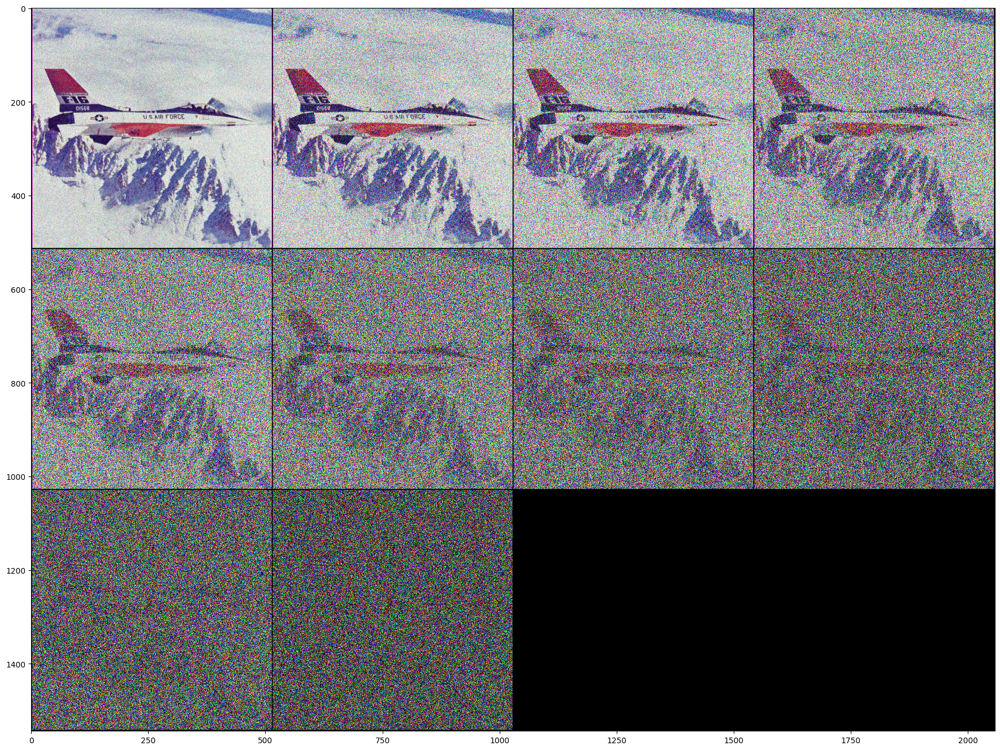

In [5]:
timesteps = 10
noisy_img_torch = noisy_img.unsqueeze(0) # .to(device)
img_input_steps = add_step_noise(noisy_img_torch, timesteps, torch.randn_like(noisy_img_torch))

img_input_steps_np = [torch_to_np(s) for s in img_input_steps]
psnr_gt = [peak_signal_noise_ratio(torch_to_np(noisy_img_torch), i) for i in img_input_steps_np]

plot_image_grid(img_input_steps_np, 4, 12)

img_input_steps.reverse()
img_input_steps_np.reverse()
psnr_gt.reverse()

In [6]:
input_depth = 32
pad = "reflection"
net = get_net(
    input_depth,
    "skip",
    pad,
    skip_n33d=128,
    skip_n33u=128,
    skip_n11=4,
    num_scales=5,
    upsample_mode="bilinear",
)
model = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=input_depth, kernel_size=3, padding=(1, 1)), net)
print(summary(model, input_data=img_input_steps[0]))

Layer (type:depth-idx)                                                                                         Output Shape              Param #
Sequential                                                                                                     [1, 3, 512, 512]          --
├─Conv2d: 1-1                                                                                                  [1, 32, 512, 512]         896
├─Sequential: 1-2                                                                                              [1, 3, 512, 512]          --
│    └─Concat: 2-1                                                                                             [1, 132, 512, 512]        --
│    │    └─Sequential: 3-1                                                                                    [1, 4, 512, 512]          140
│    │    └─Sequential: 3-2                                                                                    [1, 128, 512, 512]        2,047,824
│    └

In [7]:
mse = nn.MSELoss()
# lr = 2e-4
lr = 0.01
optimizer = optim.Adam(model.parameters(), lr=lr)
reg_noise_std = 1.0 / 30.0
exp_weight = 0.99

In [8]:
model = model.to(device)
# model_input = model_input.to(device)
model_input = img_input_steps[0].to(device)
img_input_steps = [i.to("cuda") for i in img_input_steps]

noisy_img_np = noisy_img.clone().detach().cpu().numpy()
img_np = img.clone().detach().cpu().numpy()

model_input_saved = model_input.detach().clone()
noise = model_input.detach().clone()

psrn_history = []
psrn_gt_history = []

ssim_history = []
ssim_gt_history = []

In [9]:
print("model_input shape:", model_input.shape)
print("noisy_img_np shape:", noisy_img_np.shape)
print("img_np shape:", img_np.shape)

print("model_input_saved shape:", model_input_saved.shape)
print("noise shape:", noise.shape)

model_input shape: torch.Size([1, 3, 512, 512])
noisy_img_np shape: (3, 512, 512)
img_np shape: (3, 512, 512)
model_input_saved shape: torch.Size([1, 3, 512, 512])
noise shape: torch.Size([1, 3, 512, 512])


In [10]:
def stage_scheduler(scheduler_type: str, timesteps: int, iterations: int):
    if scheduler_type == "uniform":
        return np.rint(np.linspace(1, timesteps - 1, iterations)).astype(int)
    elif scheduler_type == "sharp linear increase":
        seq = []
        x = 10
        step = 1
        for i in range(iterations):
            if i % x == 0 and step != timesteps - 1:
                step += 1
            seq.append(step)
        seq[0] = 1
        return np.array(seq)
    elif scheduler_type == "log10 linspace":
        return np.rint(
            np.log10(np.linspace(10**1, 10 ** (timesteps - 1), iterations))
        ).astype(int)
    else:
        raise ValueError("Invalid scheduler type")

In [11]:
iteration = 2000
# scheduler_type = "uniform"
scheduler_type = "sharp linear increase"
# scheduler_type = "log10 linspace"
scheduler = stage_scheduler(scheduler_type, timesteps, iteration)

  0%|          | 0/2000 [00:00<?, ?it/s]

Loss: 1.0813498497009277, PSNR: 10.193484320680383, PSNR_GT: 10.597995959926148, SSIM: 0.039040934294462204, SSIM_GT: 0.21736443042755127


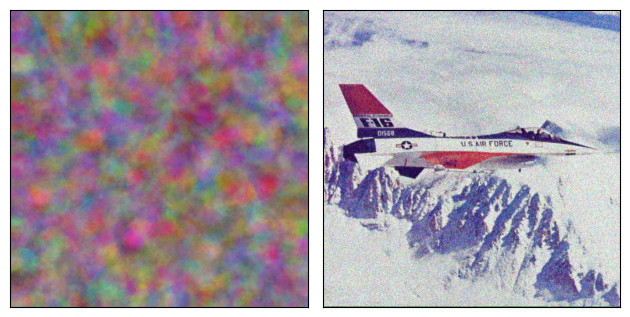

Loss: 0.01186377927660942, PSNR: 19.257769520480185, PSNR_GT: 25.445441821067533, SSIM: 0.20505177974700928, SSIM_GT: 0.7372873425483704


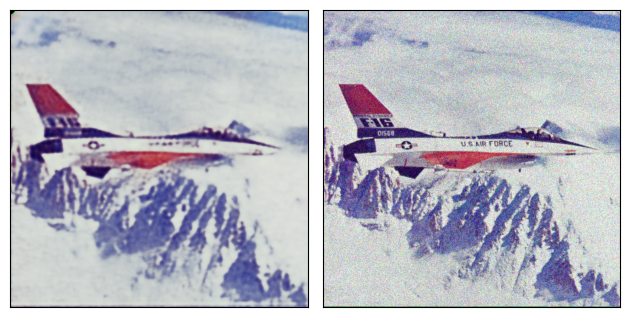

Loss: 0.010174805298447609, PSNR: 19.924738714054385, PSNR_GT: 28.77128732576871, SSIM: 0.25446972250938416, SSIM_GT: 0.822054386138916


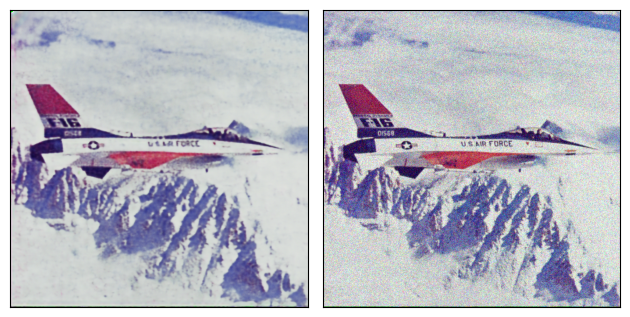

Loss: 0.009487923234701157, PSNR: 20.228288502563437, PSNR_GT: 30.44526015292798, SSIM: 0.2824608385562897, SSIM_GT: 0.8410772681236267


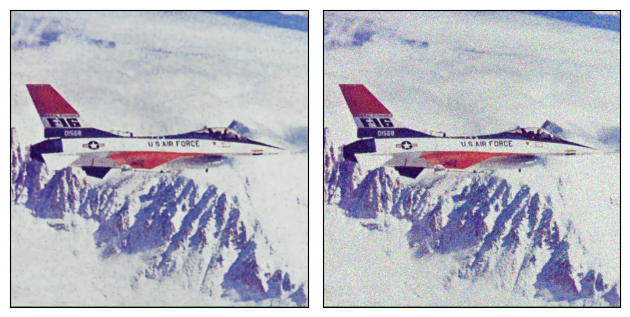

Loss: 0.009218730963766575, PSNR: 20.35328872751553, PSNR_GT: 30.338746276193945, SSIM: 0.30364182591438293, SSIM_GT: 0.8181309700012207


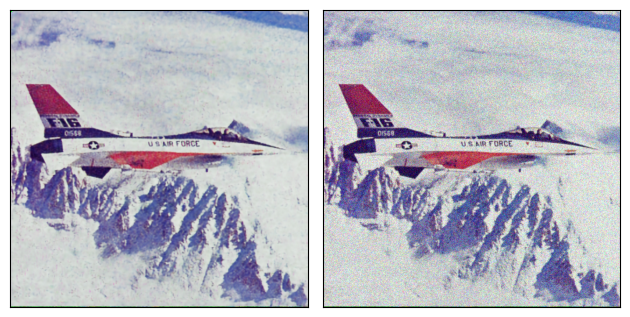

Loss: 0.009013107977807522, PSNR: 20.451254327099242, PSNR_GT: 29.938567851277007, SSIM: 0.324999064207077, SSIM_GT: 0.792332649230957


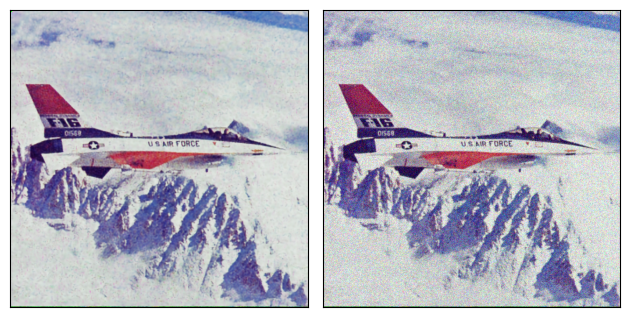

Loss: 0.008784600533545017, PSNR: 20.562779890980178, PSNR_GT: 29.527633253587137, SSIM: 0.34634461998939514, SSIM_GT: 0.7445088028907776


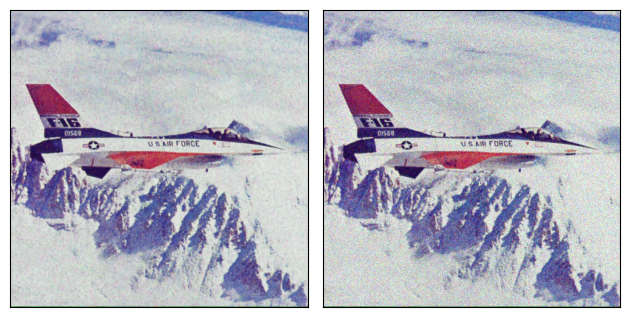

Loss: 0.00850408524274826, PSNR: 20.703724147274766, PSNR_GT: 28.912229410667813, SSIM: 0.37502336502075195, SSIM_GT: 0.7070139050483704


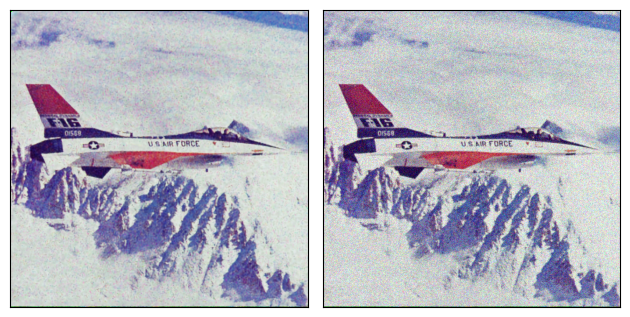

Loss: 0.008309811353683472, PSNR: 20.80408820424634, PSNR_GT: 28.2306840361548, SSIM: 0.4033685624599457, SSIM_GT: 0.6604359745979309


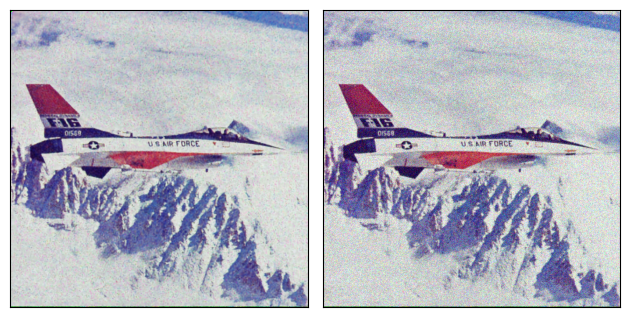

Loss: 0.008018167689442635, PSNR: 20.959248741101103, PSNR_GT: 27.736451224687514, SSIM: 0.43196773529052734, SSIM_GT: 0.6355888247489929


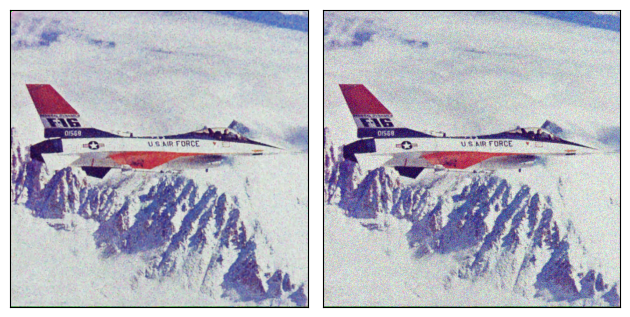

In [12]:
# step = 1
for i in (pbar := tqdm(range(iteration))):
    optimizer.zero_grad()
    model_input = model_input_saved + (noise.normal_() * reg_noise_std)

    out = model(model_input)

    # loss = mse(out, noisy_img_torch)
    # loss = mse(out, img_input_steps[step]) # TODO
    loss = mse(out, img_input_steps[scheduler[i]])
    loss.backward()
    optimizer.step()

    if i % 10 == 0:
        # if step != len(img_input_steps) - 1:
        #     step += 1
        out_np = out.detach().cpu().numpy()[0]

        psrn = peak_signal_noise_ratio(noisy_img_np, out_np)
        psrn_gt = peak_signal_noise_ratio(img_np, out_np)

        ssim = structural_similarity(
            noisy_img_np, out_np, data_range=out_np.max() - out_np.min(), channel_axis=0
        )
        ssim_gt = structural_similarity(
            img_np, out_np, data_range=out_np.max() - out_np.min(), channel_axis=0
        )

        psrn_history.append(psrn)
        psrn_gt_history.append(psrn_gt)

        ssim_history.append(ssim)
        ssim_gt_history.append(ssim_gt)

        pbar.set_postfix(
            {
                "Loss": round(loss.item(), 6),
                "PSNR": round(psrn, 2),
                "PSNR_GT": round(psrn_gt, 2),
                "SSIM": round(ssim, 2),
                "SSIM_GT": round(ssim_gt, 2),
            }
        )
    if i % 200 == 0:
        print(
            f"Loss: {loss.item()}, PSNR: {psrn}, PSNR_GT: {psrn_gt}, SSIM: {ssim}, SSIM_GT: {ssim_gt}"
        )
        plot([out.squeeze(0), noisy_img.squeeze(0)])

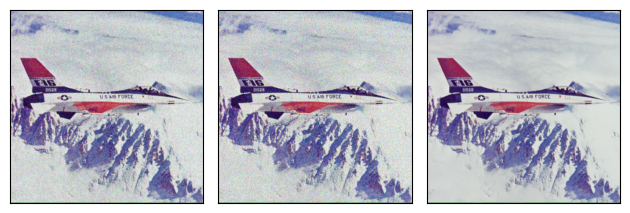

Final PSNR: 27.12783142377065, Final SSIM: 0.5946713089942932


In [13]:
out = model(model_input)
plot([out.squeeze(0), noisy_img.squeeze(0), img])
psrn_final = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])
ssim_final = structural_similarity(
    img_np, out.detach().cpu().numpy()[0], data_range=out_np.max() - out_np.min(), channel_axis=0
)
print(f"Final PSNR: {psrn_final}, Final SSIM: {ssim_final}")

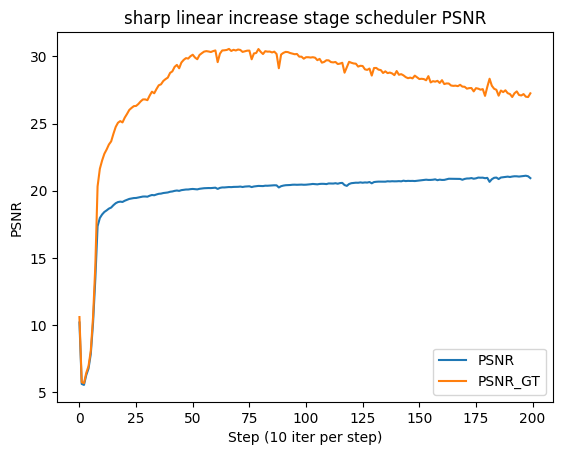

In [14]:
plt.plot(psrn_history, label="PSNR")
plt.plot(psrn_gt_history, label="PSNR_GT")
plt.xlabel("Step (10 iter per step)")
plt.ylabel("PSNR")
plt.title(f"{scheduler_type} stage scheduler PSNR")
plt.legend()

In [15]:
max_psnr = max(psrn_gt_history)
max_psnr_idx = psrn_gt_history.index(max_psnr)
print(f"Max PSNR: {max_psnr}, at step {max_psnr_idx}")

Max PSNR: 30.558095325693074, at step 66


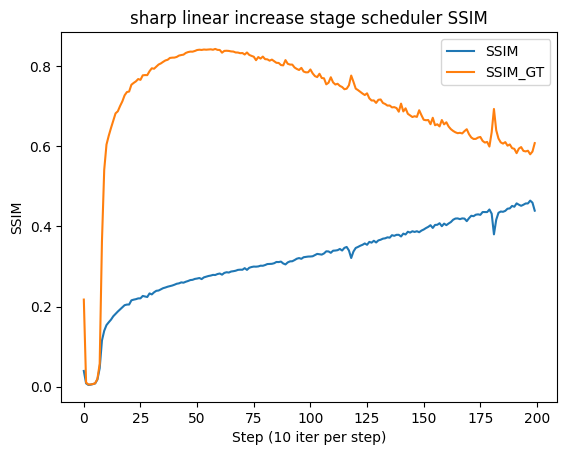

In [16]:
plt.plot(ssim_history, label="SSIM")
plt.plot(ssim_gt_history, label="SSIM_GT")
plt.xlabel("Step (10 iter per step)")
plt.ylabel("SSIM")
plt.title(f"{scheduler_type} stage scheduler SSIM")
plt.legend()

In [17]:
max_ssim = max(ssim_gt_history)
max_ssim_idx = ssim_gt_history.index(max_ssim)
print(f"Max SSIM: {max_ssim}, at step {max_ssim_idx}")

Max SSIM: 0.8437008857727051, at step 58


In [ ]:
# np.save("results/baseline_psnr.npy", np.array(psrn_history))
# np.save("results/baseline_psnr_gt.npy", np.array(psrn_gt_history))
# np.save("results/baseline_psnr_gt_sm.npy", np.array(psrn_gt_sm_history))

# np.save("results/baseline_ssim.npy", np.array(ssim_history))
# np.save("results/baseline_ssim_gt.npy", np.array(ssim_gt_history))
# np.save("results/baseline_ssim_gt_sm.npy", np.array(ssim_gt_sm_history))
# np.save("results/custom_psnr.npy", np.array(psrn_history))
# np.save("results/custom_psnr_gt.npy", np.array(psrn_gt_history))
# np.save("results/custom_psnr_gt_sm.npy", np.array(psrn_gt_sm_history))

# np.save("results/custom_ssim.npy", np.array(ssim_history))
# np.save("results/custom_ssim_gt.npy", np.array(ssim_gt_history))
# np.save("results/custom_ssim_gt_sm.npy", np.array(ssim_gt_sm_history))
np.save(f"results/{scheduler_type}_psnr.npy", np.array(psrn_history))
np.save(f"results/{scheduler_type}_psnr_gt.npy", np.array(psrn_gt_history))

np.save(f"results/{scheduler_type}_ssim.npy", np.array(ssim_history))
np.save(f"results/{scheduler_type}_ssim_gt.npy", np.array(ssim_gt_history))